_Evironmental Statitistics and Models_

## __Final Project__

In [ ]:
import numpy as np
import pandas as pd
import geopandas as gpd

from scipy.optimize import curve_fit
#2
# Plotting
import pydeck as pdk
import matplotlib.pyplot as plt


# # Raster
# import rasterio as rio

# # Spatitial Stats
# import pointpats

# # Plane Fitting
# from scipy.optimize import curve_fit 


In [58]:
import seaborn as sns
import matplotlib as mpl

mpl.rcParams.update(mpl.rcParamsDefault)

# Set Seaborn color palette
cmap = 'Set2'
sns.set_palette(cmap)

# Update Matplotlib rcParams
mpl.rcParams.update({
    'font.family': 'Consolas',  # Font family for all text
    'figure.dpi': 200,  # High resolution for figures
    
    # Axes settings
    'axes.titlesize': 12,  # Font size for the axes title
    'axes.titleweight': 'normal',  # Weight for the axes title
    'axes.labelsize': 10,  # Font size for the axes labels
    
    # Tick settings
    'xtick.direction': 'in',  # Ticks pointing inwards
    'ytick.direction': 'in',  # Ticks pointing inwards
    'xtick.minor.visible': True,  # Show minor ticks on x-axis
    'ytick.minor.visible': True,  # Show minor ticks on y-axis

    # Grid settings
    'axes.grid': True,  # Enable grid by default
    'axes.grid.which': 'both',  # Show both major and minor grids
    'grid.linestyle': ':',  # Dotted grid lines
    'grid.alpha': 0.3,  # Transparency for major grid lines
    'grid.linewidth': 0.6,  # Line width for major grid lines

})


plt.rcParams['ytick.right'] = plt.rcParams['xtick.top'] = True
plt.rcParams['ytick.left'] = plt.rcParams['ytick.labelleft'] = True

__Load Data and prepare__


In [59]:
# Read table Data
fp_table = r"data/NationalSurveyData.csv"
d = pd.read_csv(fp_table,sep=",",skipinitialspace=True,skiprows=(0,1,2,3,5,6),)

# Read Borders
shp = gpd.read_file(r"data/borders.shp")


In [60]:
# Achtung Vereinfachung
d["As"] = d['As'].str.replace(r"^<", "", regex=True).astype(float)


In [61]:
# Create a GeoDataFrame from the DataFrame and lat/lon lists
dg = gpd.GeoDataFrame(d, geometry=gpd.points_from_xy(d["LONG_DEG"], d["LAT_DEG"]))

# Set the coordinate reference system (CRS) to WGS84 (EPSG:4326)
dg.set_crs(epsg=4326, inplace=True)

# Display the GeoDataFrame
dg.head()

,SAMPLE_ID,SAMPLE_FIELD_ID,SAMPLE_DATE,LAT_DEG,LONG_DEG,YEAR_CONSTRUCTION,WELL_TYPE,WELL_DEPTH,DIVISION,DISTRICT,...,Mg,Mn,Na,P_,Si,SO4,Sr,V_,Zn,geometry
0,S98_00718,"RIP3492, BTS118",08/03/1998,23.0194,90.8786,1971.0,Shallow HP TW,12.2,Chittagong,Lakshmipur,...,29.9,0.447,7.9,1.2,13.9,< 0.2,0.246,< 0.006,0.031,POINT (90.87860 23.01940)
1,S98_00724,"RIP3493, BTS124",10/03/1998,22.9650,90.9597,1995.0,Private HP TW,12.2,Chittagong,Lakshmipur,...,15.7,0.231,205.0,0.6,13.8,1.5,0.108,< 0.006,0.021,POINT (90.95970 22.96500)
2,S98_00727,"RIP3498, BTS127",10/03/1998,22.9253,90.9744,1997.0,Private HP TW,262.1,Chittagong,Lakshmipur,...,75.8,0.294,201.0,0.3,27.2,4.9,0.873,< 0.006,0.067,POINT (90.97440 22.92530)
3,S98_00733,"RIP3494, BTS133",11/03/1998,22.8653,90.9372,1993.0,Private HP TW,7.9,Chittagong,Lakshmipur,...,124,1.17,1090.0,0.5,10.3,265,0.797,0.009,0.054,POINT (90.93720 22.86530)
4,S98_00734,"RIP3499, BTS134",11/03/1998,22.8525,90.9058,1990.0,Village HP TW,182.9,Chittagong,Lakshmipur,...,16.9,0.051,43.8,0.2,21.4,< 0.2,0.216,< 0.006,< 0.008,POINT (90.90580 22.85250)


In [62]:
dg.columns

Index(['SAMPLE_ID', 'SAMPLE_FIELD_ID', 'SAMPLE_DATE', 'LAT_DEG', 'LONG_DEG',
       'YEAR_CONSTRUCTION', 'WELL_TYPE', 'WELL_DEPTH', 'DIVISION', 'DISTRICT',
       'THANA', 'UNION', 'MOUZA', 'GEOCODE', 'As', 'Al', 'B_', 'Ba', 'Ca',
       'Co', 'Cr', 'Cu', 'Fe', 'K_', 'Li', 'Mg', 'Mn', 'Na', 'P_', 'Si', 'SO4',
       'Sr', 'V_', 'Zn', 'geometry'],
      dtype='object')

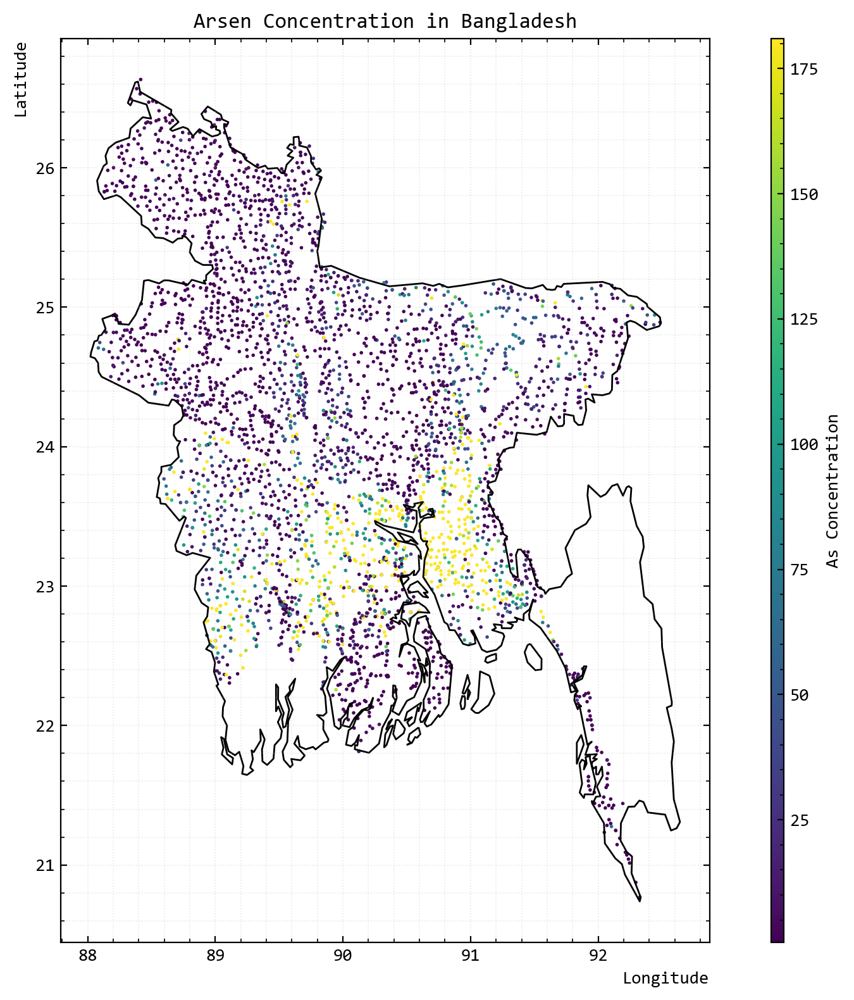

In [63]:
fig, ax = plt.subplots(figsize=(10, 8))
gdf_plot = dg.plot(column='As', cmap='viridis', vmax=np.nanpercentile(dg["As"], 90), vmin=np.nanpercentile(dg["As"], 5), markersize=1, ax=ax)
plt.title('Arsen Concentration in Bangladesh')
shp.plot(ax=gdf_plot, edgecolor='black', facecolor='none')
fig.colorbar(gdf_plot.collections[0], ax=gdf_plot,orientation="vertical",shrink=1,aspect=70,label="As Concentration")
ax.set_xlabel('Longitude',loc="right")
ax.set_ylabel('Latitude',loc="top")
plt.tight_layout()
# ax.set_xticklabels([f'{tick}°' for tick in ax.get_xticks()])
# ax.set_yticklabels([f'{tick}°' for tick in ax.get_yticks()])
plt.show()

In [64]:
gj = shp.to_json()

# Create a Pydeck GeoJsonLayer
poly= pdk.Layer(
        "GeoJsonLayer",
        data=shp,
        get_fill_color=[100,100,100,0],
        get_line_color=[120,120,120,255],  # Border color
        line_width_min_pixels=1.5
    )

# Define a layer to display the points
layer = pdk.Layer(
    'ScatterplotLayer',
    data=dg,
    get_position='[LONG_DEG, LAT_DEG]',
    get_fill_color='[0 + As * 2, 30 + As * 10, 180-As*2, 255]',
    get_radius=1400,
    pickable=True
)

# Set the viewport location
view_state = pdk.ViewState(
    latitude=dg['LAT_DEG'].mean(),
    longitude=dg['LONG_DEG'].mean(),
    zoom=7,
    pitch=0
)

# Render the deck.gl map with a light theme
r = pdk.Deck(
    layers=[poly,layer],
    initial_view_state=view_state,
    map_provider=None,
    height=500,
    tooltip={"text": "{As}"},
    map_style="light_no_labels" 
)
r.to_html('ScatterplotLayer.html',iframe_height=800)

### __Variagramm__

In [ ]:
# Ellipsoidal Coordinates to Metric CRS
main_crs = "EPSG:9678" # https://epsg.io/9678
dg = dg.to_crs(main_crs)
shp = shp.to_crs(main_crs)


In [66]:
east = dg.geometry.x
north = dg.geometry.y

# Position Vector of Observations
x_o = dg.get_coordinates().values # [East , North] # m

n_points = len(east)

print(f"n points: {n_points} observations")

n points: 3533 observations


In [67]:
x_o

array([[590312.7263189 , 545642.88163363],
       [598662.87479528, 539672.42032658],
       [600199.02084721, 535287.1883776 ],
       ...,
       [356226.90211623, 776918.34204167],
       [359580.79670502, 768653.67506328],
       [357615.66387445, 770844.99576436]])

In [68]:
east

0       590312.726319
1       598662.874795
2       600199.020847
3       596426.546436
4       593213.879346
            ...      
3528    378965.891758
3529    376383.673174
3530    356226.902116
3531    359580.796705
3532    357615.663874
Length: 3533, dtype: float64

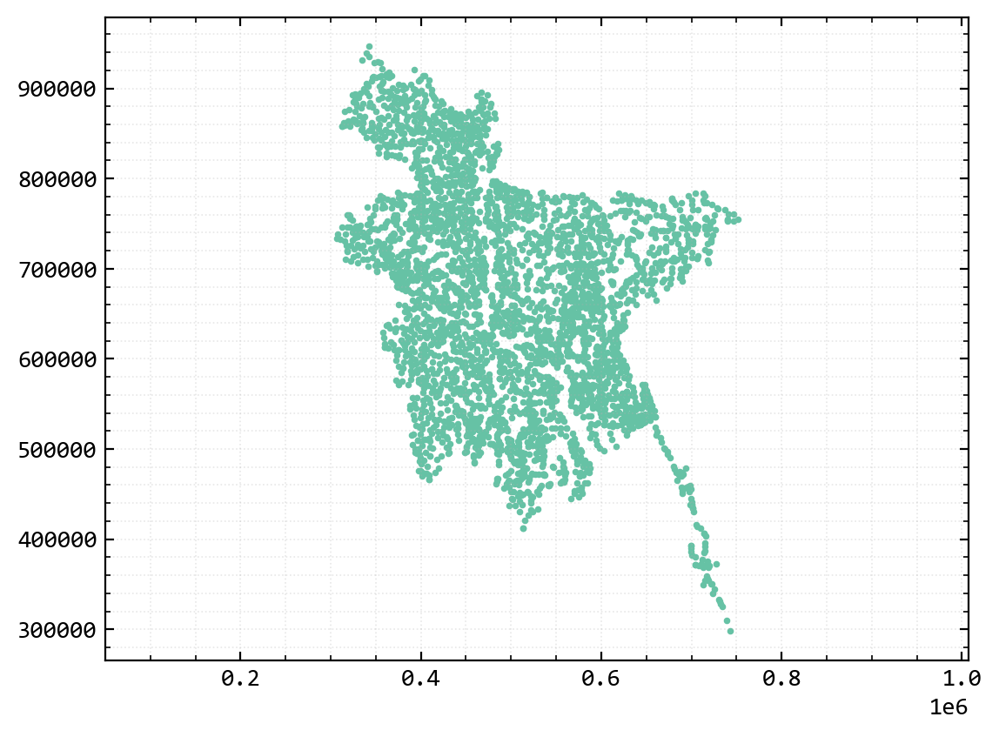

In [69]:
plt.scatter(east,north,s=3)
plt.axis("equal")
plt.show()

In [70]:
## Point to Point Distances, for all points

dists = np.linalg.norm(x_o[:,np.newaxis] - x_o[np.newaxis,:],axis=-1)

# Distanzan sind in beide Richtungen deswegen hälftze löschen
dists_half = np.triu(dists) # Diagonale auch null das nicht abstand mit sich selber berücksichtigt wird

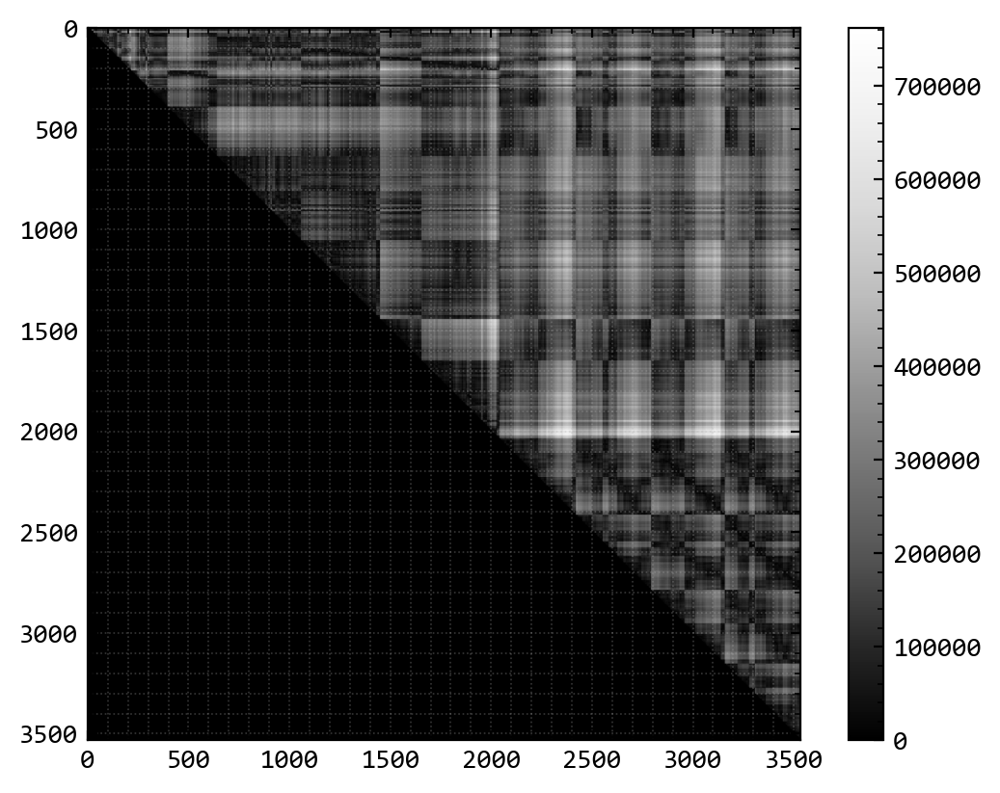

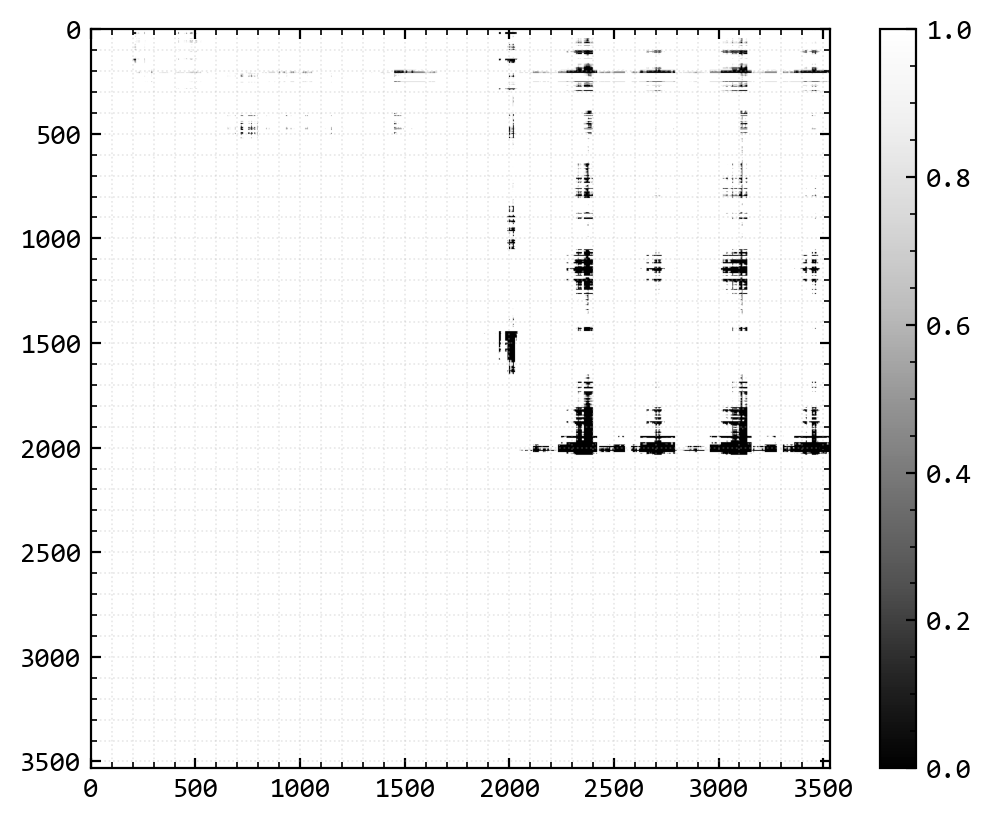

In [71]:
im = plt.imshow(dists_half,origin="upper",cmap="Greys_r")
plt.colorbar(im)
plt.show()


re = dists_half < 400000

im = plt.imshow(re,origin="upper",cmap="Greys_r")
plt.colorbar(im)
plt.show()


In [72]:
## Histogram for Distances
n_bins = 60

select_max_dist = 90 # %


# Histogramm
hist, bin_edges = np.histogram(dists,n_bins,range=(0,np.percentile(dists,select_max_dist)))

# Mean Lag h in each class
bin_centers = (bin_edges[1:]+bin_edges[:-1])/2


## Z Values
z = d["As"].values
z_diff = z[:,np.newaxis] - z[np.newaxis,:]
z_diff_half = np.triu(z_diff) # Clean that not double distance for every pair


print("-------------")
print("Max used distance:",np.percentile(dists,80)/1000,"km ("+str(select_max_dist)+" %)")
print("-------------")


-------------
Max used distance: 277.09628404895585 km (90 %)
-------------


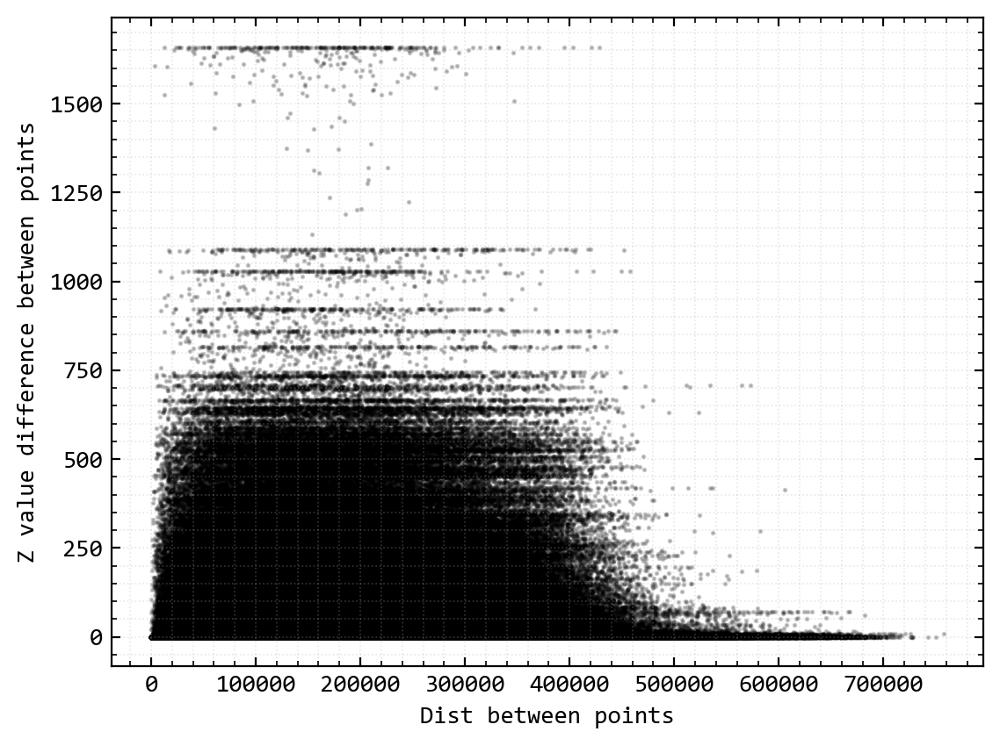

In [73]:
plt.scatter(dists.flatten()[::10],np.abs(z_diff_half.flatten()[::10]),s=1,c="k",alpha=0.2)
plt.xlabel("Dist between points")
plt.ylabel("Z value difference between points")

plt.show()

The Semivarinace is defined as followed:

$$
γ(h)=\frac{1}{2N(h)} \sum_{i=1}^{N}(Z(x_i+h)−Z(x_i))^2
$$

- where $h$ is the distance between points in the lag class
- $N(h)$ is the number of points with the distance h (Number of points per lag class).
- $x_i$ is the position of the i-th point and $Z$ is the attribute value at the position $x_i$

_(Benndorf, 2023)_

Benndorf, Jörg. Angewandte Geodatenanalyse und -Modellierung. 2023. Springer Vieweg Wiesbaden. 978-3-658-39981-8. https://doi.org/10.1007/978-3-658-39981-8

In [74]:
## Semivariance
semi_var = np.zeros(len(hist)) * np.nan

# Iterate over all lag classes
for i in range(len(hist)):
    
    # Selecting all Z values in the actual Lag Class (h or dist-class)
    diff = z_diff[(dists >= bin_edges[i]) & (dists < bin_edges[i+1])]

    # plt.figure()
    # im = plt.imshow((dists >= bin_edges[i]) & (dists < bin_edges[i+1]),origin="lower",cmap="Greys_r")
    # plt.colorbar(im)
    # plt.show()

    # Count Distances in class
    n = np.sum((dists >= bin_edges[i]) & (dists < bin_edges[i+1]) ) # number of distances in class i
    
    # print(n)
    # print(np.sum( diff**2 ))
    # print(1 / (n*2) * np.sum( diff**2 ))
    # print("---")

    # Semivariance for Class i
    semi_var[i] = 1 / (n*2) * np.sum( diff**2 )

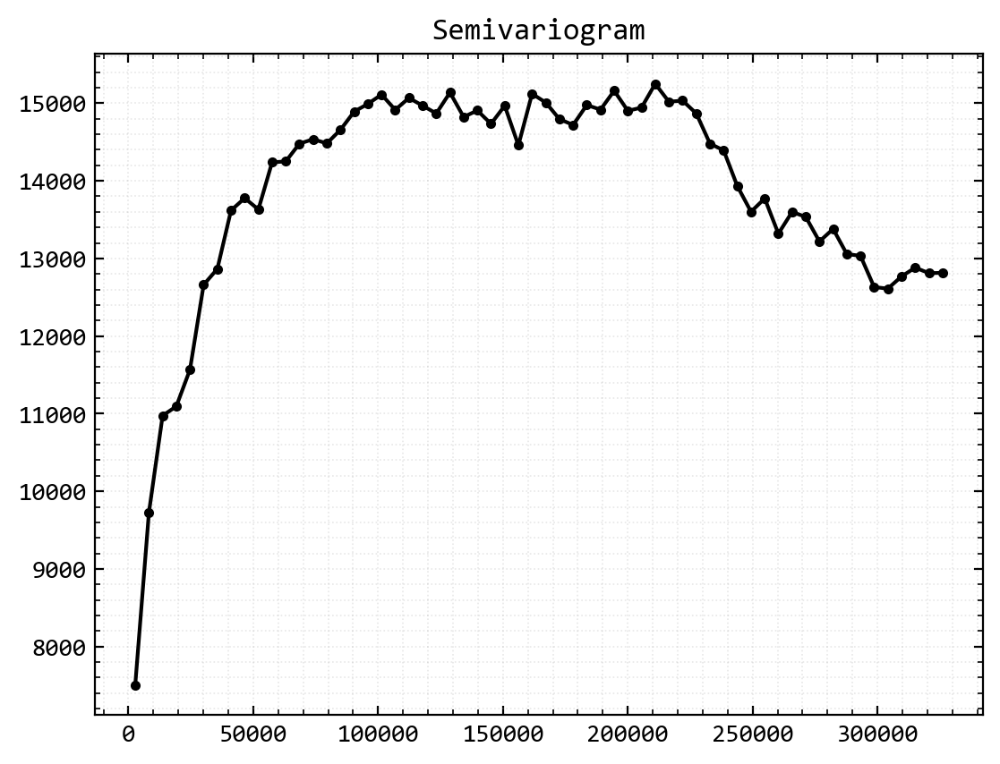

In [75]:
plt.plot(bin_centers,semi_var,marker='o',ms=3,c="k")
plt.title("Semivariogram")
plt.show()

### __Theoretical Variogramm model Fitting__

In [77]:
# https://scikit-gstat.readthedocs.io/en/latest/technical/fitting.html


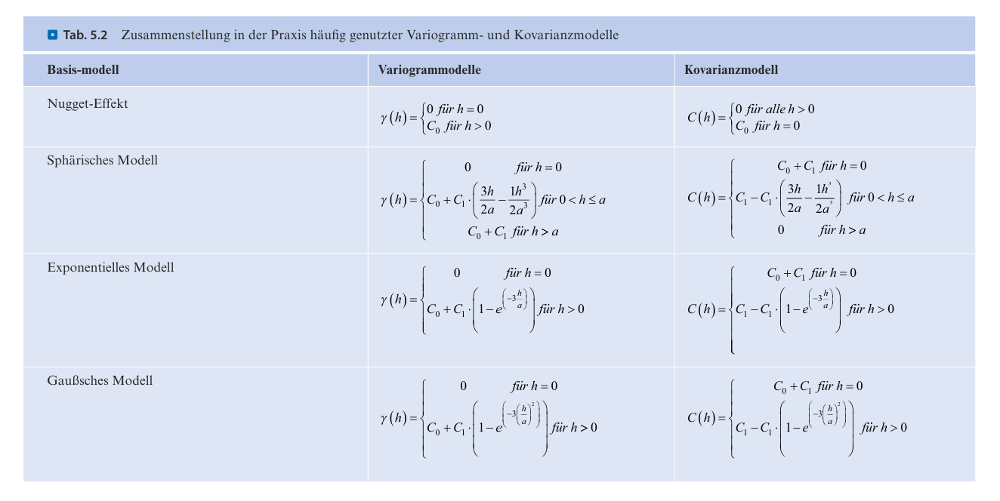

The formula for the spherical variogram model is given by:

$$
\gamma(h) = 
\begin{cases} 
C_0 + C \left[ \frac{3h}{2a} - \frac{1}{2} \left( \frac{h}{a} \right)^3 \right] & \text{if } 0 \leq h \leq a \\
C_0 + C & \text{if } h > a 
\end{cases}
$$

where:
- $h$ is the lag distance,
- $C_0$ is the nugget,
- $C$ is the sill minus the nugget,
- $a$ is the range.

Modified formula to include $C_0$ fo $h=0$

In [78]:
semi_var.shape

(60,)

In [79]:
bin_centers.shape

(60,)

In [80]:
def spherical(h, c0, c, a):
    semivar = np.zeros_like(h)
    mask1 = (h >=0 ) & (h <= a)
    mask2 = h > a
    semivar[mask1] = c0 + c * (3 * h[mask1] / (2 * a) - 0.5 * (h[mask1] / a) ** 3)
    semivar[mask2] = c0 + c
    return semivar


def spherical_cov(h, c0, c, a):
    covariance = np.zeros_like(h)
    mask1 = (h >=0 ) & (h <= a)
    # mask2 = h > a
    covariance[mask1] = c - c * (3 * h[mask1] / (2 * a) - 0.5 * (h[mask1] / a) ** 3)
    # covariance[mask2] = 0 # already Zero
    return covariance


x = bin_centers[1:] # Drop first element to remove peak/disturbance
y = semi_var[1:]
# TODO automate the p0 value selction from expireminetal variogram
# TODO hinzufügen von bounds wie in https://scikit-gstat.readthedocs.io/en/latest/technical/fitting.html
cof_u, cov = curve_fit(spherical, x, y,p0 = [10000,15000,100000] )


In [81]:
cof_u

array([ 8894.26730751,  5405.98987005, 64454.98854708])

In [82]:
np.var(z)

14017.793352598273

In [83]:
"""def cov(h,c0,c,a):
    return c0 + c - spherical(h,c0,c,a)
    """

'def cov(h,c0,c,a):\n    return c0 + c - spherical(h,c0,c,a)\n    '

In [84]:
h_theo = np.linspace(0,bin_edges.max(),100)
semivar_theo = spherical(h_theo,cof_u[0],cof_u[1],cof_u[2])

cov = spherical_cov(h_theo,cof_u[0],cof_u[1],cof_u[2])

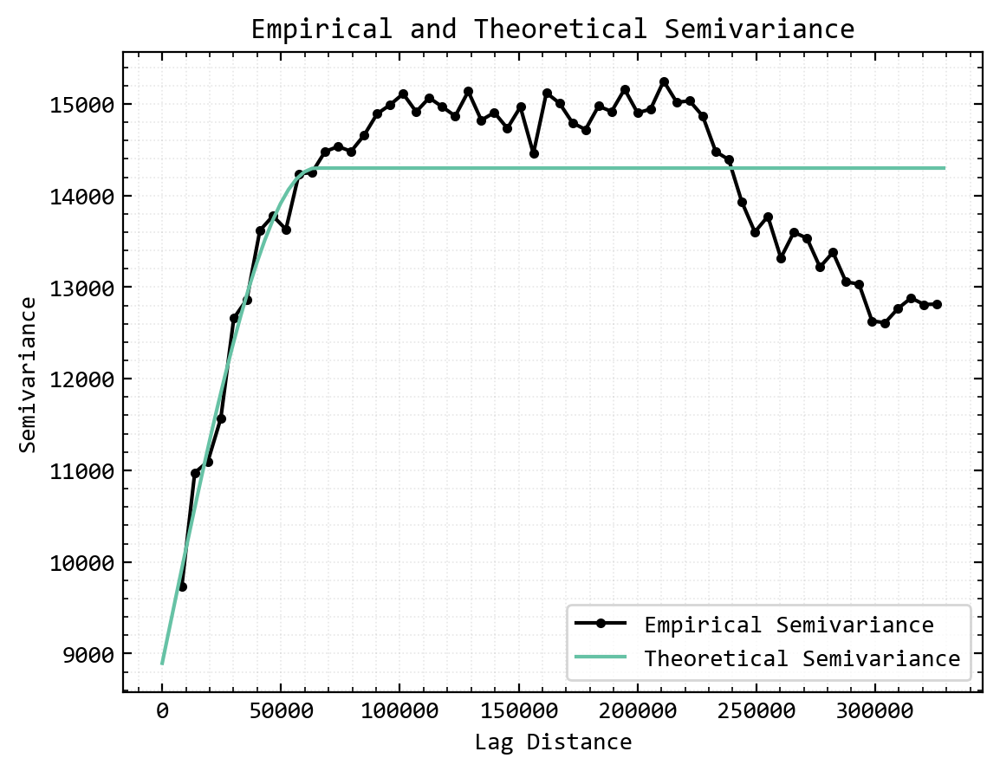

In [85]:
plt.plot(bin_centers[1:], semi_var[1:], marker='o', ms=3, c="k", label='Empirical Semivariance')
plt.plot(h_theo, semivar_theo, label='Theoretical Semivariance')
plt.xlabel('Lag Distance')
plt.ylabel('Semivariance')
plt.title('Empirical and Theoretical Semivariance')
plt.legend()
plt.show()

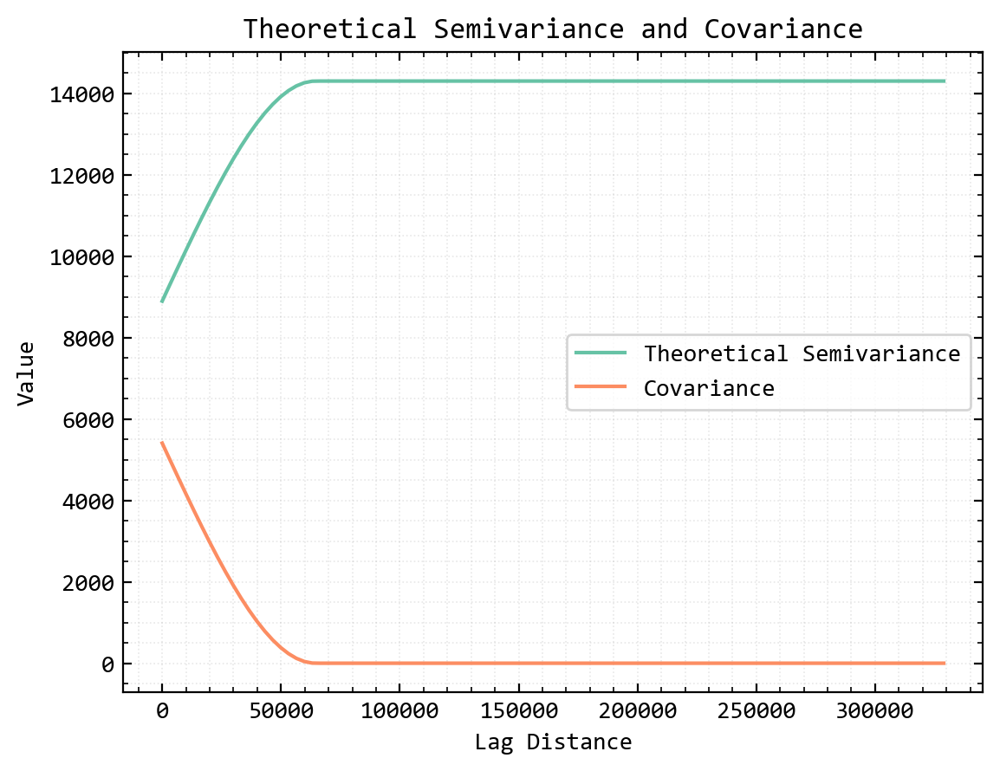

In [86]:
plt.plot(h_theo, semivar_theo, label='Theoretical Semivariance')
plt.plot(h_theo, cov, label='Covariance')
plt.xlabel('Lag Distance')
plt.ylabel('Value')
plt.title('Theoretical Semivariance and Covariance')
plt.legend()
plt.show()

### __Kriging__

In [87]:
# Erstmal simple Kriging
# Dann Indikator Kriging was gefragt ist

__Covariance and Interpolations weights__

The Covariance is derived from the Semmivariance:

$$
Cov(h) = 
\begin{cases} 
C - C \left[ \frac{3h}{2a} - \frac{1}{2} \left( \frac{h}{a} \right)^3 \right] & \text{if } 0 \leq h \leq a \\
0 & \text{if } h > a 
\end{cases}
$$


The Weigths for the Kriging are Calulated via the Covariance for each interpolation point:

$$
\lambda = \mathbf{C^{-1} \cdot c_0}
$$

the matrizes looks like that:



$$
\lambda =
\begin{bmatrix}
    \lambda_1 \\
    \lambda_2 \\
    \vdots \\
    \lambda_2
\end{bmatrix}, \quad
\mathbf{C} =
\begin{bmatrix}
    \text{Cov}[x_1, x_1] & \text{Cov}[x_1, x_2] & \cdots & \text{Cov}[x_1, x_n] \\
    \text{Cov}[x_2, x_1] & \text{Cov}[x_2, x_2] & \cdots & \text{Cov}[x_2, x_n] \\
    \vdots & \vdots & \ddots & \vdots \\
    \text{Cov}[x_n, x_1] & \text{Cov}[x_n, x_2] & \cdots & \text{Cov}[x_n, x_n]
\end{bmatrix}, \quad
\mathbf{c}_0 =
\begin{bmatrix}
    \text{Cov}(x_1, x_0) \\
    \text{Cov}(x_2, x_0) \\
    \vdots \\
    \text{Cov}(x_n, x_0)
\end{bmatrix}
$$


__Simple Kriging__

$$
Z^*_{SK}(x_0) = \sum_{i=0}^{n} \lambda_i \cdot z(x_i) + \lambda_m \cdot m
$$

$$with$$

$$
\lambda_m = 1 - \sum_{i=0}^{n} \lambda_i.
$$


In [88]:
# Map range Bangladesh
n_range = (north.min(),north.max())
e_range = (east.min(),east.max())

# Interpolation Coords
res = 20_000
x_n, x_e = np.mgrid[n_range[0]:n_range[1]:res,e_range[0]:e_range[1]:res]

In [89]:
x_n.max()

938033.9214006034

In [90]:
x_e.max() # Passt

746464.0503999616

In [91]:
x_n

array([[298033.9214006, 298033.9214006, 298033.9214006, 298033.9214006,
        298033.9214006, 298033.9214006, 298033.9214006, 298033.9214006,
        298033.9214006, 298033.9214006, 298033.9214006, 298033.9214006,
        298033.9214006, 298033.9214006, 298033.9214006, 298033.9214006,
        298033.9214006, 298033.9214006, 298033.9214006, 298033.9214006,
        298033.9214006, 298033.9214006, 298033.9214006],
       [318033.9214006, 318033.9214006, 318033.9214006, 318033.9214006,
        318033.9214006, 318033.9214006, 318033.9214006, 318033.9214006,
        318033.9214006, 318033.9214006, 318033.9214006, 318033.9214006,
        318033.9214006, 318033.9214006, 318033.9214006, 318033.9214006,
        318033.9214006, 318033.9214006, 318033.9214006, 318033.9214006,
        318033.9214006, 318033.9214006, 318033.9214006],
       [338033.9214006, 338033.9214006, 338033.9214006, 338033.9214006,
        338033.9214006, 338033.9214006, 338033.9214006, 338033.9214006,
        338033.9214006

In [92]:
x_p = np.asarray([x_e.flatten(),x_n.flatten()])# points of interpolation

In [93]:
x_p[:,1].max()

326464.05039996165

In [94]:
x_p

array([[306464.05039996, 326464.05039996, 346464.05039996, ...,
        706464.05039996, 726464.05039996, 746464.05039996],
       [298033.9214006 , 298033.9214006 , 298033.9214006 , ...,
        938033.9214006 , 938033.9214006 , 938033.9214006 ]])

In [95]:
x_p = np.rot90(x_p)
x_p

array([[746464.05039996, 938033.9214006 ],
       [726464.05039996, 938033.9214006 ],
       [706464.05039996, 938033.9214006 ],
       ...,
       [346464.05039996, 298033.9214006 ],
       [326464.05039996, 298033.9214006 ],
       [306464.05039996, 298033.9214006 ]])

In [96]:
x_o[:,1].max()

946489.9016660643

In [97]:
# Covariance for all Observation Points
C = spherical_cov(dists,_,cof_u[1],cof_u[2]) # TODO include local search area to cut computing costs

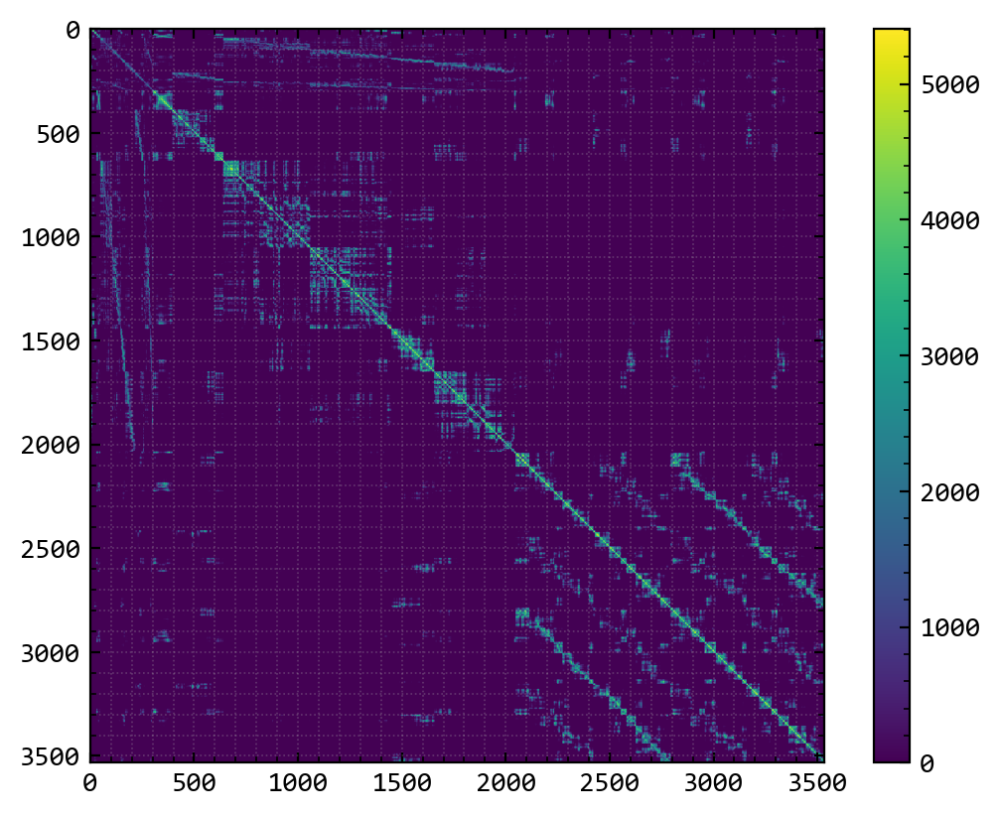

In [98]:
plt.imshow(C)
plt.colorbar()
plt.show()

In [99]:
x_p.shape

(759, 2)

In [100]:
x_o.shape

(3533, 2)

In [101]:
x_p[3,:]

array([686464.05039996, 938033.9214006 ])

In [102]:

i = 122
dists_p = np.linalg.norm(x_o[:] - x_p[i,:],axis=-1)
dists_p.shape

(3533,)

In [103]:
x_o[:] - x_p[i,:]

array([[ -16151.32408106, -292391.03976697],
       [  -7801.17560468, -298361.50107403],
       [  -6265.02955275, -302746.733023  ],
       ...,
       [-250237.14828373,  -61115.57935894],
       [-246883.25369494,  -69380.24633732],
       [-248848.38652551,  -67188.92563624]])

In [104]:
dists_p.min()

55862.99686799185

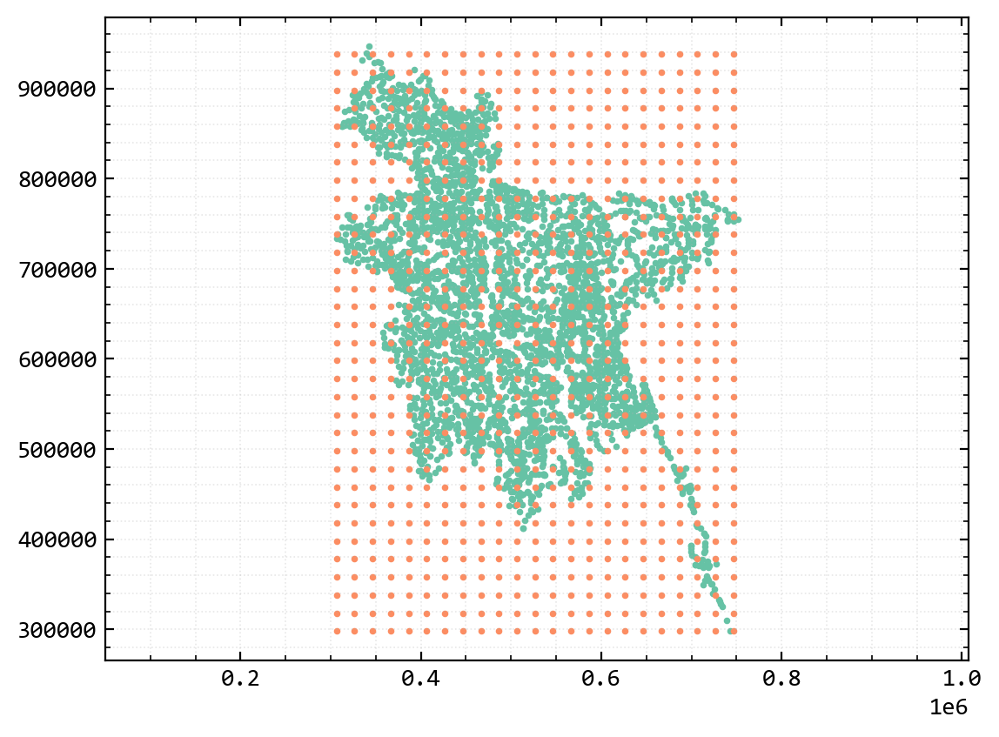

In [105]:
plt.scatter(x_o[:,0],x_o[:,1],s=3)
plt.scatter(x_p[:,0],x_p[:,1],s=3)
plt.axis("equal")
plt.show()

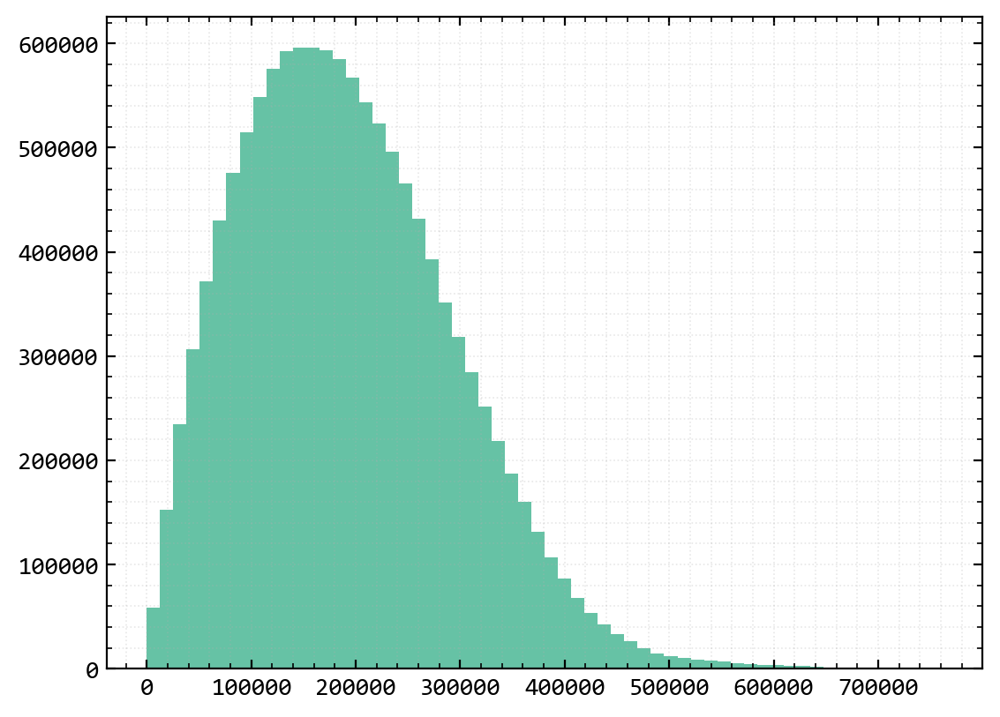

In [106]:
plt.hist(dists.flatten(),60)
plt.show()

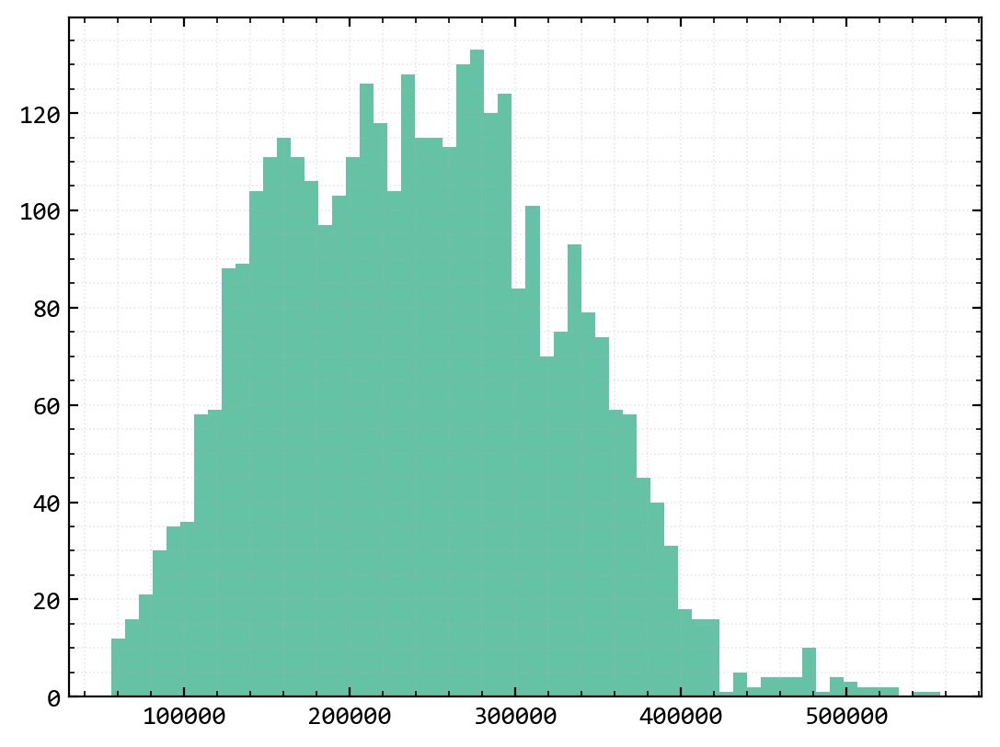

In [107]:
plt.hist(dists_p,60)
plt.show()

In [108]:
dists_p.min()

55862.99686799185

In [109]:
c_0 = spherical_cov(dists_p,_,cof_u[1],cof_u[2])
c_0

array([0., 0., 0., ..., 0., 0., 0.])

In [110]:
cof_u[0],cof_u[1],cof_u[2]

(8894.267307513324, 5405.989870053329, 64454.988547079825)

In [111]:
C_iv = np.linalg.inv(C)
m = z.mean()

In [113]:
Z_sk = np.empty(x_p.shape[0])
for i in range(x_p.shape[0]):

    dists_p = np.linalg.norm(x_o[:] - x_p[i,:],axis=-1)
    c_0 = spherical_cov(dists_p,_,cof_u[1],cof_u[2])
    
    lam = C_iv @ c_0[:, None]
    lam_m = 1 - np.sum(lam)
    # print(i,lam_m)

    Z_sk[i] = np.sum( lam * z + lam_m * m )

0 1.0
1 1.0
2 1.0
3 1.0
4 1.0
5 1.0
6 1.0
7 1.0
8 1.0
9 1.0
10 1.0
11 1.0
12 -2.4969019406343017e+27
13 1.2941726138814966e+30
14 -2.829410067761931e+30
15 -1.1936141143942664e+30
16 -1892127878024575.0
17 1252696203433089.0
18 621303226742785.0
19 592114935158801.0
20 -348900044251235.0
21 48535260910983.0
22 28813878768695.375
23 1.0
24 1.0
25 1.0
26 1.0
27 1.0
28 1.0
29 1.0
30 1.0
31 1.0
32 1.0
33 1.0
34 52387016897737.0
35 -2.0402601120373433e+30
36 -1.116591678712456e+31
37 -1.0776945426102568e+31
38 -1.3767064021072427e+31
39 -2.4911258722289445e+30
40 -2.445510907501056e+16
41 -2.286693411291443e+16
42 -2910990559953407.0
43 452765061444881.0
44 320055025096993.0
45 10442864457367.0
46 1.0
47 1.0
48 1.0
49 1.0
50 1.0
51 1.0
52 1.0
53 1.0
54 1.0
55 1.0
56 1.0
57 -1.304414988238378e+29
58 -3.778016980653707e+30
59 2.2976594568826193e+31
60 -1.4321388756090227e+31
61 -2.1445893753809666e+31
62 -7.366547067210412e+30
63 -4.25889987097225e+28
64 8.390869866584064e+16
65 -710573544454

In [114]:
Z_sk.shape

(759,)

In [115]:
Z_sk = Z_sk.reshape(x_e.shape)

In [116]:
# TODO reshape irgendwas pass noch nicht mit der Orientierung von Z_sk

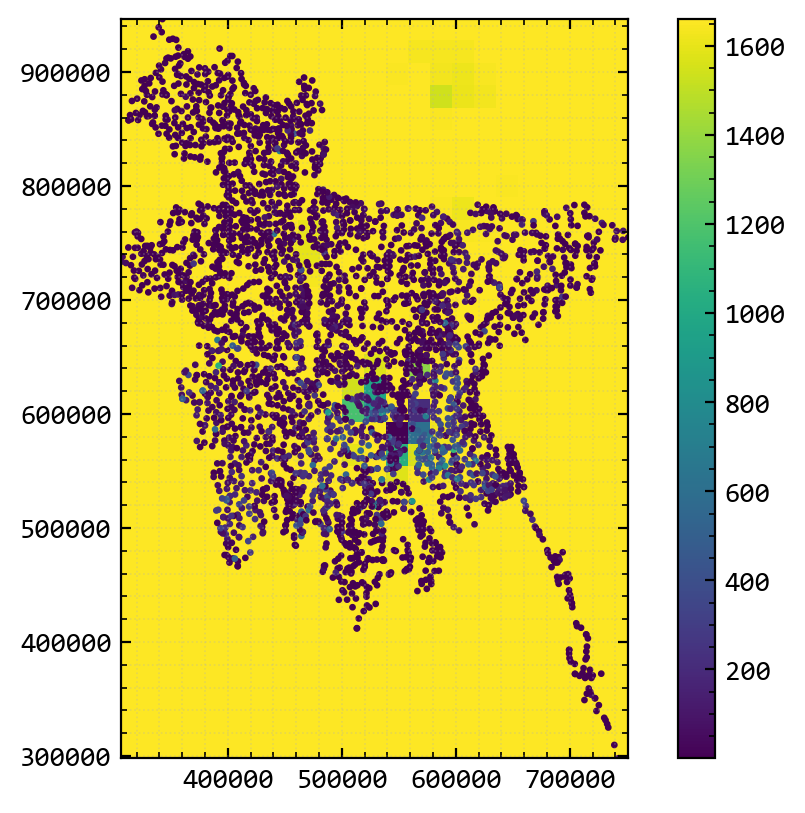

In [117]:
plt.imshow(Z_sk, vmin=np.nanpercentile(Z_sk, 0), vmax=np.nanpercentile(Z_sk, 90), extent=[e_range[0], e_range[1], n_range[0], n_range[1]])
plt.scatter(x_o[:,0],x_o[:,1],c=z,s=2)
plt.colorbar()
plt.show()
